In [1]:
from pathlib import Path
import json
import numpy as np
from tqdm.auto import tqdm
from gensim import corpora
from gensim.models import LsiModel
from gensim.models import KeyedVectors

In [2]:
def extract_text(text_path):
    fin = open(text_path, "r", encoding="UTF-8")
    json_objs = []
    for ln in fin:
        json_data = json.loads(ln)
        json_objs.append(json_data)
    fin.close()
    
    text = []
    for j_idx, jobj in enumerate(tqdm(json_objs)):
        for text_idx, text_obj in enumerate(jobj["text"]):            
            if isinstance(text_obj["c"], list):
                text.append(list(text_obj["t"]) + 
                            list("\n".join(text_obj["c"])))
            else:
                text.append(list(text_obj["t"]) + 
                            list(text_obj["c"]))
    return text

In [3]:
text_path_list = list(Path("../corpus/dynasty_split/").glob("*.jsonl"))
text_path_list

[]

In [4]:
dyn0 = extract_text("dynasty_split/先秦.jsonl")
dyn1 = extract_text("dynasty_split/漢.jsonl")
dyn2 = extract_text('dynasty_split/魏晉南北.jsonl')

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

In [5]:
len(dyn0), len(dyn1), len(dyn2)

(755, 1562, 1380)

In [6]:
dyn0[10:]

[['小',
  '爾',
  '雅',
  '\n',
  '\n',
  '{',
  '{',
  '百',
  '}',
  '}',
  '\n',
  '\n',
  '神',
  '仙',
  '傳',
  '卷',
  '三',
  '\n',
  '\n',
  '河',
  '上',
  '公',
  '\n',
  '\n',
  '河',
  '上',
  '公',
  '者',
  '莫',
  '知',
  '其',
  '姓',
  '字',
  '漢',
  '文',
  '帝',
  '時',
  '公',
  '結',
  '誥',
  '橘',
  '應',
  '干',
  '河',
  '之',
  '演',
  '帝',
  '讀',
  '老',
  '子',
  '經',
  '頗',
  '好',
  '之',
  '敕',
  '諸',
  '王',
  '及',
  '大',
  '臣',
  '皆',
  '誦',
  '之',
  '有',
  '朔',
  '不',
  '解',
  '數',
  '事',
  '時',
  '人',
  '莫',
  '能',
  '道',
  '之',
  '間',
  '時',
  '皆',
  '稱',
  '河',
  '匕',
  '公',
  '解',
  '機',
  '子',
  '睡',
  '義',
  '旨',
  '乃',
  '使',
  '齎',
  '所',
  '不',
  '法',
  '之',
  '事',
  '以',
  '周',
  '公',
  '曰',
  '道',
  '尊',
  '德',
  '貴',
  '非',
  '可',
  '遙',
  '間',
  '也',
  '帝',
  '即',
  '幸',
  '箕',
  '廬',
  '明',
  '聞',
  '之',
  '帝',
  '曰',
  '昔',
  '天',
  '之',
  '下',
  '莫',
  '非',
  '王',
  '土',
  '率',
  '土',
  '之',
  '實',
  '韓',
  '非',
  '王',
  '臣',
  '城',
  '中',
  '四',
  '大',
  '王',
  '居',
  '其'

In [7]:
vocab = corpora.Dictionary(dyn0)
vocab.filter_extremes(no_below=5)  
docmat = [vocab.doc2bow(x) for x in dyn0]
lsa = LsiModel(docmat)

for topic_id, topic in lsa.show_topics(num_topics=5, num_words=10, formatted=False):
    print("Topic #{}:".format(topic_id))
    words = [vocab[int(word_id)] for word_id, weight in topic]
    print(words)
    print("")

Topic #0:
['}', '{', '氣', '物', '反', '己', '形', '陽', '亦', '吾']

Topic #1:
['氣', '陽', '陰', '病', '脈', '帝', '少', '伯', '太', '寒']

Topic #2:
['秦', '齊', '今', '于', '魏', '！', '氣', '楚', '趙', '吾']

Topic #3:
['秦', '于', '魏', '齊', '趙', '楚', '韓', '晏', '惟', '！']

Topic #4:
['于', '拜', '主', '西', '黃', '爵', '化', '面', '賔', '司']



## Basic statistics

In [8]:
print("dyn0 char count", sum(len(x) for x in dyn0))
print("dyn1 char count", sum(len(x) for x in dyn1))
print("dyn2 char count", sum(len(x) for x in dyn2))

dyn0 char count 2241345
dyn1 char count 13152213
dyn2 char count 16740426


In [9]:
def make_lsa_vec(dyn_data):
    vocab = corpora.Dictionary(dyn_data)
    vocab.filter_extremes(no_below=5)    
    docmat = [vocab.doc2bow(x) for x in dyn_data]
    lsa = LsiModel(docmat)
    lsavec = lsa.projection.u * lsa.projection.s
    kv = KeyedVectors(200)    
    kv.add_vectors(list(vocab.token2id.keys()), lsavec)
    print("vocab: ", len(kv.index_to_key))
    return kv, vocab, lsa

In [10]:
print("Running dyn0"); kv0, vocab0, lsa0 = make_lsa_vec(dyn0)
print("Running dyn1"); kv1, vocab1, lsa1 = make_lsa_vec(dyn1)
print("Running dyn2"); kv2, vocab2, lsa2 = make_lsa_vec(dyn2)

Running dyn0
vocab:  4324
Running dyn1
vocab:  6609
Running dyn2
vocab:  7347


In [11]:
kv_list = [
    {"kv": kv0, "note": "dynasty_split/先秦.jsonl"},
    {"kv": kv1, "note": "dynasty_split/漢.jsonl"},
    {"kv": kv2, "note": "dynasty_split/魏晉南北.jsonl"}
]

In [12]:
import joblib
kv_list_path = joblib.dump(kv_list, "dyn_kvlist_3dyns.joblib")[0]
!sha1sum $kv_list_path

zsh:1: command not found: sha1sum


In [13]:
list(set(kv0.index_to_key) & set(kv1.index_to_key) & set(kv2.index_to_key))[:10]

['馴', '飫', '荒', '壓', '怍', '禽', '榭', '圜', '瑾', '冗']

In [14]:
kv0.most_similar("雪")

[('隔', 0.8222154378890991),
 ('落', 0.8130696415901184),
 ('飄', 0.8046497702598572),
 ('雲', 0.8002477884292603),
 ('霜', 0.7967658042907715),
 ('斜', 0.7689726948738098),
 ('星', 0.7674230337142944),
 ('殞', 0.7604864835739136),
 ('裹', 0.7489579319953918),
 ('奇', 0.7444320321083069)]

In [15]:
kv1.most_similar("雪")

[('蟲', 0.8489413261413574),
 ('董', 0.8467274308204651),
 ('畢', 0.8315714001655579),
 ('謹', 0.8289133906364441),
 ('墮', 0.828412652015686),
 ('暑', 0.8248358368873596),
 ('翼', 0.8239132165908813),
 ('藝', 0.8205046057701111),
 ('暮', 0.8172020316123962),
 ('羅', 0.8166615962982178)]

In [16]:
kv2.most_similar("雪")

[('霜', 0.7185323238372803),
 ('鸚', 0.6903210282325745),
 ('揣', 0.668617844581604),
 ('燭', 0.6558924913406372),
 ('吹', 0.6437444090843201),
 ('蘭', 0.6339278817176819),
 ('聊', 0.632229745388031),
 ('誘', 0.6293457746505737),
 ('賦', 0.6291744709014893),
 ('翔', 0.6274754405021667)]

In [17]:
from sklearn.cluster import KMeans
import numpy as np

# assume embeddings for each set are stored in `embeddings1`, `embeddings2`, and `embeddings3` KeyedVectors objects

# merge all embeddings into a single numpy array
all_embeddings = np.concatenate([kv0.vectors, kv1.vectors, kv2.vectors])

# specify the number of clusters
num_clusters = 10

# perform K-means clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=0).fit(all_embeddings)

# get the cluster labels for each embedding
cluster_labels = kmeans.labels_

# separate the cluster labels for each set of embeddings
labels1 = cluster_labels[:len(kv0.vectors)]
labels2 = cluster_labels[len(kv0.vectors):(len(kv0.vectors)+len(kv1.vectors))]
labels3 = cluster_labels[(len(kv1.vectors)+len(kv2.vectors)):]

# print the cluster labels for each set of embeddings
print("Cluster labels for dyn0:", labels1)
print("Cluster labels for dyn1:", labels2)
print("Cluster labels for dyn2:", labels3)


/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster labels for dyn0: [5 8 8 ... 5 5 5]
Cluster labels for dyn1: [9 0 3 ... 5 5 5]
Cluster labels for dyn2: [5 5 5 ... 5 5 5]


/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 17935 (\N{CJK UNIFIED IDEOGRAPH-460F}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 18429 (\N{CJK UNIFIED IDEOGRAPH-47FD}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


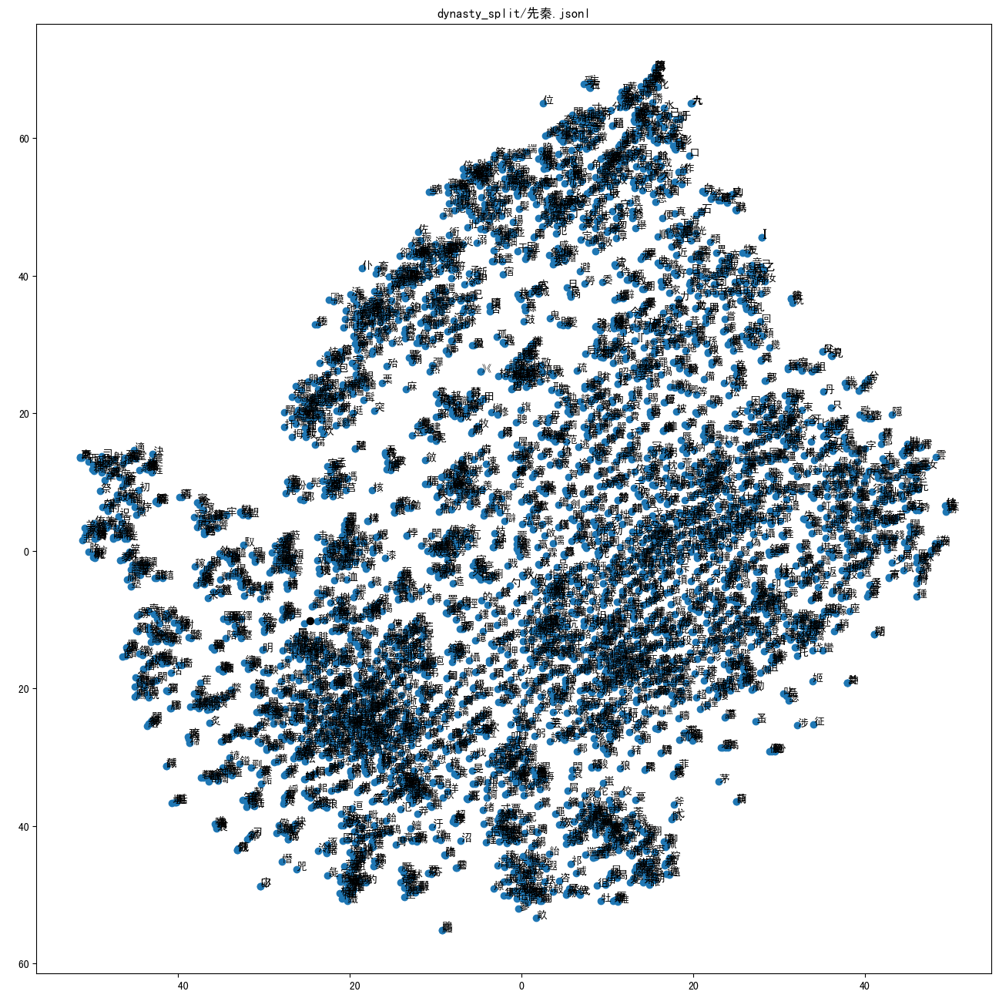

/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 14122 (\N{CJK UNIFIED IDEOGRAPH-372A}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 13433 (\N{CJK UNIFIED IDEOGRAPH-3479}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 14444 (\N{CJK UNIFIED IDEOGRAPH-386C}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 13532 (\N{

/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 14383 (\N{CJK UNIFIED IDEOGRAPH-382F}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 16425 (\N{CJK UNIFIED IDEOGRAPH-4029}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 18163 (\N{CJK UNIFIED IDEOGRAPH-46F3}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 131761 (\N{CJK UNIFIED IDEOGRAPH-202B1}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarnin

/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 158033 (\N{CJK UNIFIED IDEOGRAPH-26951}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 162847 (\N{CJK UNIFIED IDEOGRAPH-27C1F}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 17138 (\N{CJK UNIFIED IDEOGRAPH-42F2}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 140095 (\N{CJK UNIFIED IDEOGRAPH-2233F}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWa

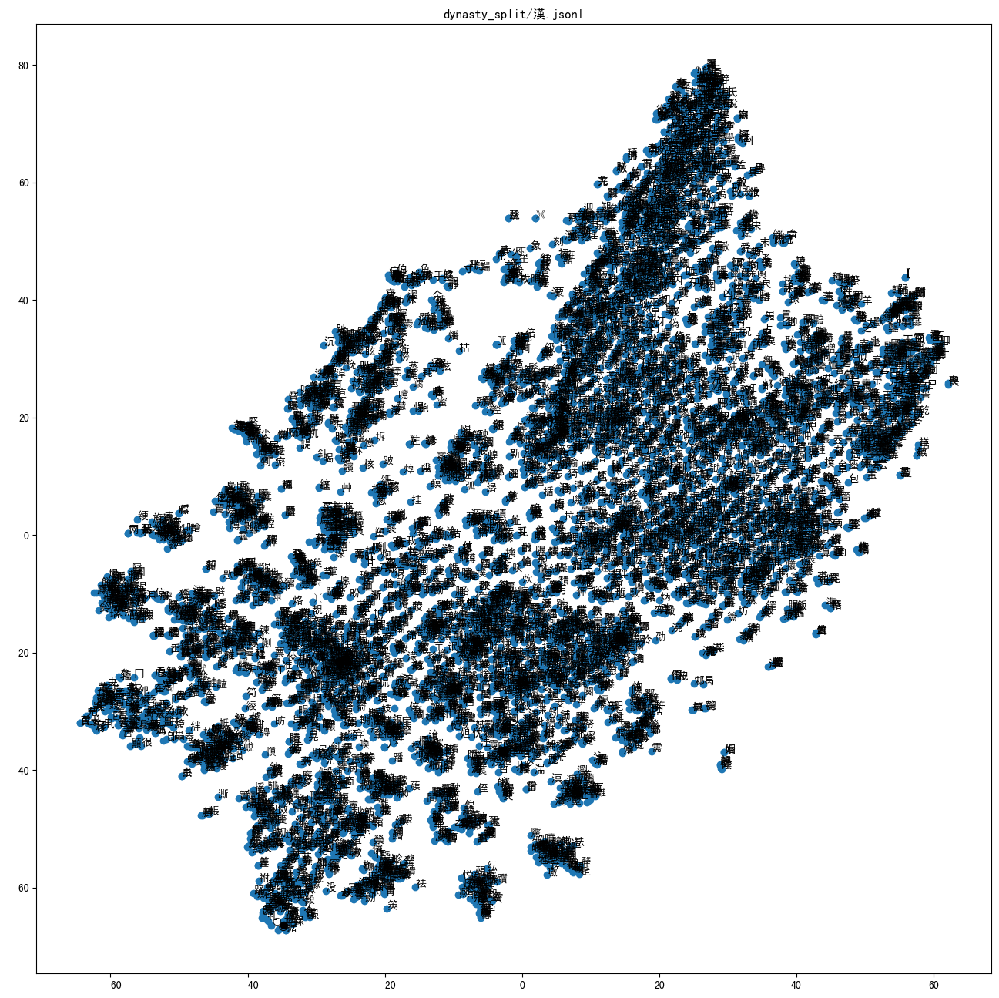

/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 17935 (\N{CJK UNIFIED IDEOGRAPH-460F}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 15875 (\N{CJK UNIFIED IDEOGRAPH-3E03}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 15892 (\N{CJK UNIFIED IDEOGRAPH-3E14}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 13656 (\N{

/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 15253 (\N{CJK UNIFIED IDEOGRAPH-3B95}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 167382 (\N{CJK UNIFIED IDEOGRAPH-28DD6}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 15968 (\N{CJK UNIFIED IDEOGRAPH-3E60}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 19519 (\N{CJK UNIFIED IDEOGRAPH-4C3F}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarnin

/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 58397 (\ue41d) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 14149 (\N{CJK UNIFIED IDEOGRAPH-3745}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 15554 (\N{CJK UNIFIED IDEOGRAPH-3CC2}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 133860 (\N{CJK UNIFIED IDEOGRAPH-20AE4}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 141813 (\N{CJK 

/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 15445 (\N{CJK UNIFIED IDEOGRAPH-3C55}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 17436 (\N{CJK UNIFIED IDEOGRAPH-441C}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 15280 (\N{CJK UNIFIED IDEOGRAPH-3BB0}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 15759 (\N{CJK UNIFIED IDEOGRAPH-3D8F}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/deborahwatty/Library/Python/3.8/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning:

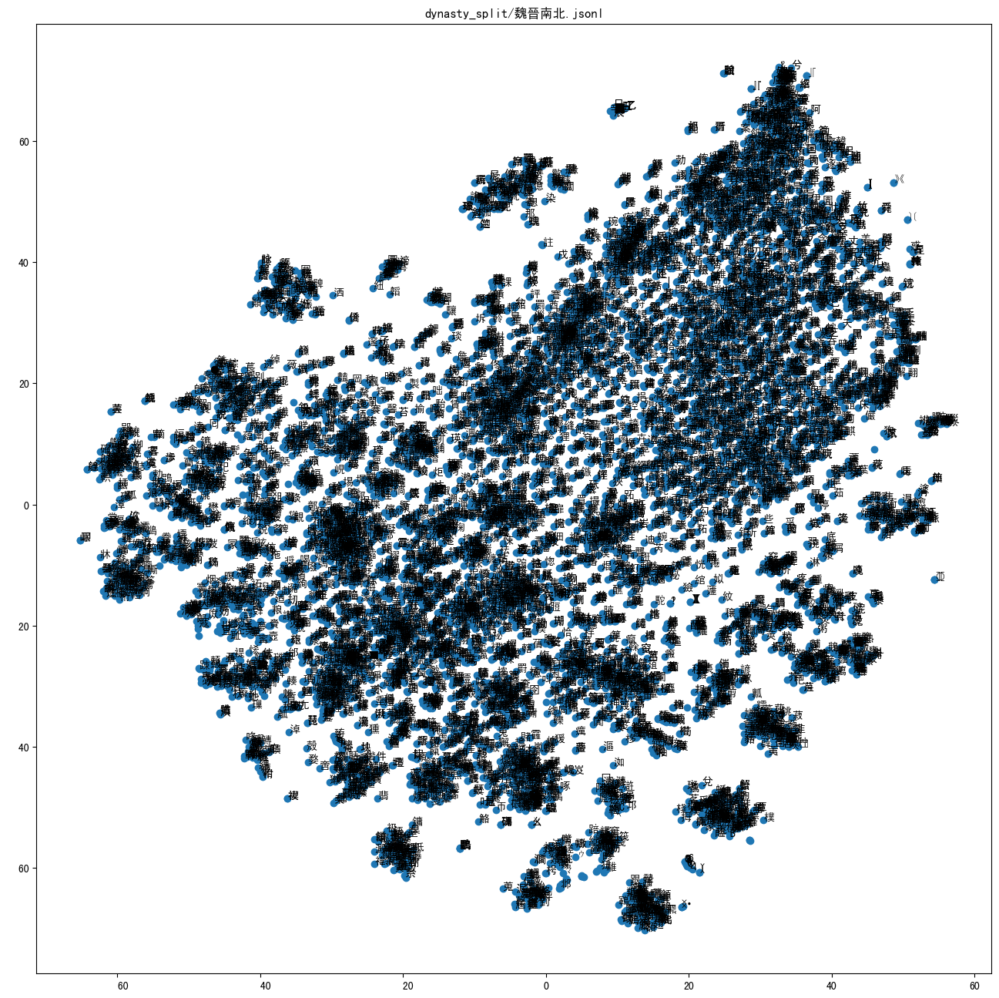

In [18]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE



def plot_tsne_scatter(kv, title):
    tsne = TSNE(n_components=2, random_state=0)
    X = kv.vectors
    X_tsne = tsne.fit_transform(X)
    plt.rcParams['font.family'] = 'sans-serif'
    plt.rcParams['font.sans-serif'] = ['Noto Sans CJK', 'Source Han Sans', 'Microsoft YaHei', 'SimHei', 'STHeiti']

    plt.figure(figsize=(16, 16))
    plt.scatter(X_tsne[:, 0], X_tsne[:, 1])
    words = kv.index_to_key
    for i, word in enumerate(words):
        plt.annotate(word, xy=(X_tsne[i, 0], X_tsne[i, 1]), fontname='SimHei')
    plt.title(title)
    plt.show()
    
for kv in kv_list:
    plot_tsne_scatter(kv["kv"], kv["note"])


In [19]:
import random

import numpy as np
from gensim.models import LsiModel
from gensim import corpora

# Define a function to compute a statistic of interest
def compute_statistic(lsa):
    # Compute the cosine similarity between two randomly chosen words in the vocabulary
    vocab = lsa.id2word
    word1, word2 = random.sample(list(vocab.token2id.keys()), 2)
    vec1 = lsa[vocab.doc2bow([word1])]
    vec2 = lsa[vocab.doc2bow([word2])]
    sim = np.dot(vec1, vec2) / (np.linalg.norm(vec1) * np.linalg.norm(vec2))
    return sim


# Compute the observed values of the statistic for each LSA model
observed1 = compute_statistic(kv0)
observed2 = compute_statistic(kv1)
observed3 = compute_statistic(kv2)

# Generate random permutations of the LSA models and compute the values of the statistic for each permutation
num_permutations = 10000
permutation_stats = []
for i in range(num_permutations):
    # Shuffle the order of the LSAs
    lsas = [lsa0, lsa1, lsa2]
    random.shuffle(lsas)
    # Compute the statistic for the permuted LSAs
    permuted_stat = compute_statistic(lsas[0]) - compute_statistic(lsas[1])
    permutation_stats.append(permuted_stat)

# Compute the p-value of the observed differences
permute_count = sum(abs(permuted_stat) >= abs(observed1 - observed2) for permuted_stat in permutation_stats)
p_value = permute_count / num_permutations
print("p-value:", p_value)


AttributeError: 'KeyedVectors' object has no attribute 'id2word'

In [ ]:
import numpy as np
from sklearn.cluster import KMeans

cluster_assignments[word] = kmeans.predict(vec.reshape(1, -1))[0]

# Initialize KMeans object
kmeans = KMeans(n_clusters=10, random_state=42)

# Create dictionary to store cluster assignments for each word
cluster_assignments = {}

# Iterate over each word in the vocabulary and concatenate the LSA vectors
for idx, word in enumerate(kv0.index_to_key + kv1.index_to_key + kv2.index_to_key):
    vec = np.concatenate((lsa0.projection.u * lsa0.projection.s[idx],
                          lsa1.projection.u * lsa1.projection.s[idx],
                          lsa2.projection.u * lsa2.projection.s[idx]))
    cluster_assignments[word] = kmeans.predict(vec.reshape(1, 200))[0]

# Print the top words in each cluster
for cluster_idx in range(10):
    words = [word for word, cluster in cluster_assignments.items() if cluster == cluster_idx]
    top_words = sorted(words, key=lambda word: kv0.distance(word, "good"))[:10]
    print(f"Cluster {cluster_idx + 1}: {', '.join(top_words)}")


In [ ]:
def mean_diff(group1, group2):
    return np.mean(group1) - np.mean(group2)

In [ ]:
def permutation_test(group1, group2, num_permutations=1000):
    # Combine the two groups into a single array
    combined = np.concatenate((group1, group2))

    # Calculate the observed difference in means
    obs_diff = mean_diff(group1, group2)

    # Initialize an array to store the permutation differences
    perm_diffs = np.zeros(num_permutations)

    # Perform the permutations
    for i in range(num_permutations):
        # Shuffle the combined array
        np.random.shuffle(combined)

        # Split the shuffled array into two groups
        perm_group1 = combined[:len(group1)]
        perm_group2 = combined[len(group1):]

        # Calculate the difference in means for the permuted groups
        perm_diffs[i] = mean_diff(perm_group1, perm_group2)

    # Calculate the p-value
    print(np.sum(perm_diffs >= obs_diff))
    p_value = np.sum(perm_diffs >= obs_diff) / num_permutations

    return obs_diff, p_value


In [ ]:
# Define the pairs of dynasties to compare
pairs = [(0, 1), (0, 2), (1, 2)]

# Perform the permutation test for each pair
for pair in pairs:
    dyn1 = pair[0]
    dyn2 = pair[1]
    kv1 = kv_list[dyn1]["kv"]
    kv2 = kv_list[dyn2]["kv"]
    obs_diff, p_value = permutation_test(kv1.vectors, kv2.vectors)
    print("Dynasty {} vs. Dynasty {}: Observed difference = {:.4f}, p-value = {:.4f}".format(dyn1, dyn2, obs_diff, p_value))


In [ ]:
from itertools import permutations
import numpy as np

# Combine all the keys from all the KV dictionaries into one list
keys = set(kv0.index_to_key).union(kv1.index_to_key).union(kv2.index_to_key)

# Create a dictionary that maps each key to its index
key_to_idx = {k: i for i, k in enumerate(keys)}

# Create arrays to hold the combined embeddings for each dynasty
dyn0_emb = np.zeros((len(keys), 200))
dyn1_emb = np.zeros((len(keys), 200))
dyn2_emb = np.zeros((len(keys), 200))

# Fill in the arrays with the embeddings for each key in each dynasty
for k in keys:
    if k in kv0:
        dyn0_emb[key_to_idx[k]] = kv0[k]
    if k in kv1:
        dyn1_emb[key_to_idx[k]] = kv1[k]
    if k in kv2:
        dyn2_emb[key_to_idx[k]] = kv2[k]

# Define a function to compute the cosine similarity between two embeddings
def cosine_sim(a, b):
    return np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b))

# Compute the cosine similarities between all pairs of dynasty embeddings
similarity_matrix = np.zeros((3, 3))
for i, j in permutations(range(3), 2):
    similarity = np.mean([cosine_sim(dyn_emb[i], dyn_emb[j]) for dyn_emb in [dyn0_emb, dyn1_emb, dyn2_emb]])
    similarity_matrix[i, j] = similarity

# Compute the p-value using permutation testing
num_permutations = 1000
similarity_differences = []
for _ in range(num_permutations):
    permuted_dyn0_emb = np.random.permutation(dyn0_emb)
    permuted_dyn1_emb = np.random.permutation(dyn1_emb)
    permuted_dyn2_emb = np.random.permutation(dyn2_emb)
    permuted_similarities = np.zeros((3, 3))
    for i, j in permutations(range(3), 2):
        similarity = np.mean([cosine_sim(dyn_emb[i], dyn_emb[j]) for dyn_emb in [permuted_dyn0_emb, permuted_dyn1_emb, permuted_dyn2_emb]])
        permuted_similarities[i, j] = similarity
    similarity_difference = similarity_matrix - permuted_similarities
    similarity_differences.append(np.abs(similarity_difference).sum())

p_value = (np.array(similarity_differences) >= np.abs(similarity_matrix - similarity_matrix.T).sum()).mean()
print(f'p-value: {p_value}')
if p_value < 0.05:
    print('There is a significant difference between the kv vectors obtained from each dynasty.')
else:
    print('There is no significant difference between the kv vectors obtained from each dynasty.')
